In [ ]:
import numpy as np
import pandas as pd
import re
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import random
import nltk
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import logging
import multiprocessing as mp
from functools import partial
from gensim import corpora
from gensim.models import LdaMulticore
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import logging
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import gensim
from gensim import corpora
from gensim.models import LdaMulticore, CoherenceModel
import multiprocessing as mp
import pickle
import warnings
warnings.filterwarnings("ignore")

In [15]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\harsh\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
# # Read only the first 100,000 rows
# df = pd.read_csv("song_lyrics.csv", nrows=30000)

# # Save it as a new file if needed
# df.to_csv("subset_30k.csv", index=False)

In [28]:
# df = pd.read_csv('random_10k_songs.csv')
df = pd.read_csv('../Datasets/inlp_topic_modelling.csv').drop(columns=['releaseDate'])

In [29]:
# df = df.dropna()

In [30]:
len(df)

53133

In [31]:
df.head()

,title,artist,genre,lyrics,language
0,Nothing,A,NaN,gimme some love\nand we ain't got nothing\nand...,NaN
1,These Ruins,A Burning Water,NaN,of once remembered states of emptiness\nthe wa...,NaN
2,I Can Buy You,A Camp,NaN,but i can't make you do what you don't\nand i ...,NaN
3,Algebra,A Camp,NaN,'cause you were always on the run\nfrom the da...,NaN
4,The Bluest Eyes In Texas,A Camp,NaN,i can still see the wind in her golden hair\nt...,NaN


In [32]:
print(df['genre'].unique())

[nan '["Adult album alternative"]' '["Indie pop"]' ...
 '["Nu metal","Alternative rock"]'
 '["Hip hop music","Pop music","Indie rock","Synthpop","Schlager music"]'
 '["Jam band","Country music"]']


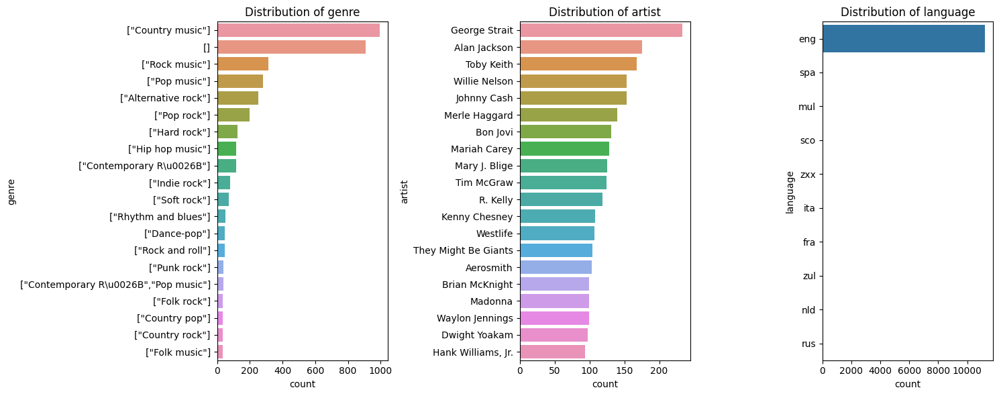

In [33]:
columns_to_plot = ["genre", "artist", "language"]  # Replace with actual column names

# Plot bar charts for categorical distributions
plt.figure(figsize=(15, 6))
for i, col in enumerate(columns_to_plot, 1):
    plt.subplot(1, len(columns_to_plot), i)
    sns.countplot(y=df[col], order=df[col].value_counts().index[:20])
    plt.title(f"Distribution of {col}")

plt.tight_layout()
plt.show()

In [ ]:
!pip install bertopic

Defaulting to user installation because normal site-packages is not writeable
  Using cached bertopic-0.17.0-py3-none-any.whl.metadata (23 kB)
  Using cached hdbscan-0.8.40-cp312-cp312-win_amd64.whl.metadata (15 kB)
  Using cached sentence_transformers-4.1.0-py3-none-any.whl.metadata (13 kB)
  Using cached umap_learn-0.5.7-py3-none-any.whl.metadata (21 kB)
  Using cached transformers-4.51.3-py3-none-any.whl.metadata (38 kB)
  Using cached pynndescent-0.5.13-py3-none-any.whl.metadata (6.8 kB)
  Using cached huggingface_hub-0.30.2-py3-none-any.whl.metadata (13 kB)
  Using cached tokenizers-0.21.1-cp39-abi3-win_amd64.whl.metadata (6.9 kB)
  Using cached safetensors-0.5.3-cp38-abi3-win_amd64.whl.metadata (3.9 kB)
Using cached bertopic-0.17.0-py3-none-any.whl (150 kB)
Using cached hdbscan-0.8.40-cp312-cp312-win_amd64.whl (726 kB)
   ---------------------------------------- 0.0/14.8 MB ? eta -:--:--
   -- ------------------------------------- 1.0/14.8 MB 6.3 MB/s eta 0:00:03
   ----- -------

In [34]:
lyrics_docs = df['lyrics'].tolist()

In [36]:
lyrics_docs[:5]

["gimme some love\nand we ain't got nothing\nand we ain't got nothing nothing\nand nothing's what you've got",
 'of once remembered states of emptiness\nthe water is rising\nin your eyes to bleed and see\nin truth as the pages turn now',
 "but i can't make you do what you don't\nand i can hire you oh yeah oh yeah\nand i can buy you oh yeah oh yeah\nbut i can't make you love me i can't make you care",
 "'cause you were always on the run\nfrom the darkness in your heart\nso you wear it on the outside\nfrom the poison in your lungs",
 'i can still see the wind in her golden hair\nthe bluest eyes in texas are haunting me tonight\nlike the stars that fill the midnight sky her memory fills my mind\nwhere did i go wrong did i wait too long or can i make it right']

In [37]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

embedding_model = SentenceTransformer("all-MiniLM-L6-v2", device='cuda')

topic_model = BERTopic(embedding_model=embedding_model)

topics, probs = topic_model.fit_transform(lyrics_docs)

In [38]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,29381,-1_you_the_and_my,"[you, the, and, my, to, we, it, me, love, in]",[one more night with you\ni won't think it thr...
1,0,3160,0_she_her_girl_said,"[she, her, girl, said, was, woman, wants, says...",[she don’t know what she does\nthat’s why i'm ...
2,1,853,1_love_more_fall_loved,"[love, more, fall, loved, way, say, baby, you,...",[oh it's just love love love love love\noh fee...
3,2,814,2_nigga_niggas_fuck_shit,"[nigga, niggas, fuck, shit, niggaz, bitch, yo,...",[my niggas half a b we got money\ni make love ...
4,3,524,3_dream_dreams_dreaming_dreamin,"[dream, dreams, dreaming, dreamin, wake, true,...",[if i could be in your dream\nyou're just a dr...
...,...,...,...,...,...
337,336,10,336_bop_montana_lula_hanna,"[bop, montana, lula, hanna, doll, ala, bam, la...",[be bop a-lula she's my baby\nbe bop a-lula sh...
338,337,10,337_shadow_staring_wool_fooled,"[shadow, staring, wool, fooled, window, covere...",[in the shadow i'll clip your wings\nand i'll ...
339,338,10,338_rude_bad_rudy_grinch,"[rude, bad, rudy, grinch, boy, mean, mr, boys,...",[you're a mean one\nyou're a mean one mr grinc...
340,339,10,339_strange_talkin_something_weird,"[strange, talkin, something, weird, activity, ...",[people so strange and bizarre\ni know you kno...


In [39]:
topic_info = topic_model.get_topic_info()

In [40]:
topic_model.visualize_topics()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'customdata': array([[0, 'she | her | girl | said | was', 3160],
                                   [1, 'love | more | fall | loved | way', 853],
                                   [2, 'nigga | niggas | fuck | shit | niggaz', 814],
                                   ...,
                                   [338, 'rude | bad | rudy | grinch | boy', 10],
                                   [339, 'strange | talkin | something | weird | activity', 10],
                                   [340, 'told | stay | coulda | loved | rekindle', 10]], dtype=object),
              'hovertemplate': '<b>Topic %{customdata[0]}</b><br>%{customdata[1]}<br>Size: %{customdata[2]}',
              'legendgroup': '',
              'marker': {'color': '#B0BEC5',
                         'line': {'color': 'DarkSlateGrey', 'width': 2},
                         'size': {'bdata': ('WAxVAy4DDALrAc8BjQFpAVoBWQFKAU' ... 'AKAAoACgAKAAoACgAKAAoACgAKAA=='),
                                  'dtype': 'i2'},
                         'sizemode': 'area',
                         'sizeref': 1.975,
                         'symbol': 'circle'},
              'mode': 'markers',
              'name': '',
              'orientation': 'v',
              'showlegend': False,
              'type': 'scatter',
              'x': {'bdata': ('3z+rvxi5PEAex7XATsB4wG8ET0Cgbl' ... 'bBnKnuQEULYUD2beFA8LPkQHdJOkA='),
                    'dtype': 'f4'},
              'xaxis': 'x',
              'y': {'bdata': ('NWxRQWnJSL0XDJK/Oe40QHQx2EBpqr' ... '3APjEbwX8TAT/NsrjACHC1wESqmLw='),
                    'dtype': 'f4'},
              'yaxis': 'y'}],
    'layout': {'annotations': [{'showarrow': False,
                                'text': 'D1',
                                'x': -15.620389890670776,
                                'y': 5.626893115043639,
                                'yshift': 10},
                               {'showarrow': False,
                                'text': 'D2',
                                'x': 2.374316859245301,
                                'xshift': 10,
                                'y': 22.474214458465575}],
               'height': 650,
               'hoverlabel': {'bgcolor': 'white', 'font': {'family': 'Rockwell', 'size': 16}},
               'legend': {'itemsizing': 'constant', 'tracegroupgap': 0},
               'margin': {'t': 60},
               'shapes': [{'line': {'color': '#CFD8DC', 'width': 2},
                           'type': 'line',
                           'x0': 2.374316859245301,
                           'x1': 2.374316859245301,
                           'y0': -11.220428228378296,
                           'y1': 22.474214458465575},
                          {'line': {'color': '#9E9E9E', 'width': 2},
                           'type': 'line',
                           'x0': -15.620389890670776,
                           'x1': 20.369023609161378,
                           'y0': 5.626893115043639,
                           'y1': 5.626893115043639}],
               'sliders': [{'active': 0,
                            'pad': {'t': 50},
                            'steps': [{'args': [{'marker.color': [['red',
                                                                  '#B0BEC5',
                                                                  '#B0BEC5',
                                                                  '#B0BEC5',
                                                                  '#B0BEC5',
                                                                  '#B0BEC5',
                                                                  '#B0BEC5',
                                                                  '#B0BEC5',
                                                                  '#B0BEC5',
                                                                  '#B0BEC5',
                                                                  '#B0BEC5',
                                 

In [41]:
topic_model.visualize_barchart(top_n_topics=20)

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'marker': {'color': '#D55E00'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.004057064103839233, 0.004252079367681354,
                    0.004706089145662894, 0.02297845298193609,
                    0.029012145521093203],
              'xaxis': 'x',
              'y': [was  , said  , girl  , her  , she  ],
              'yaxis': 'y'},
             {'marker': {'color': '#0072B2'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.004807685541924466, 0.004870549171444984,
                    0.005218956318790742, 0.005265349658398381,
                    0.018767485599209877],
              'xaxis': 'x2',
              'y': [way  , loved  , fall  , more  , love  ],
              'yaxis': 'y2'},
             {'marker': {'color': '#CC79A7'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.012028247134359809, 0.014564777158866268,
                    0.015193823350224603, 0.03037259468508006, 0.03886765561627974],
              'xaxis': 'x3',
              'y': [niggaz  , shit  , fuck  , niggas  , nigga  ],
              'yaxis': 'y3'},
             {'marker': {'color': '#E69F00'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.007238021219994396, 0.007368697533596044,
                    0.013719920182965311, 0.031213638966430046,
                    0.05330342612884195],
              'xaxis': 'x4',
              'y': [wake  , dreamin  , dreaming  , dreams  , dream  ],
              'yaxis': 'y4'},
             {'marker': {'color': '#56B4E9'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.01621932776378713, 0.01645816452814709,
                    0.018059972719770712, 0.01857960691249287, 0.03706682674911869],
              'xaxis': 'x5',
              'y': [bottle  , drunk  , wine  , whiskey  , drink  ],
              'yaxis': 'y5'},
             {'marker': {'color': '#009E73'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.011750426882803203, 0.019709199692458865,
                    0.022818684970494958, 0.03409575703136959,
                    0.052736846146097346],
              'xaxis': 'x6',
              'y': [burnin  , flame  , burning  , burn  , fire  ],
              'yaxis': 'y6'},
             {'marker': {'color': '#F0E442'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.012412260078781719, 0.01533515969562606,
                    0.016936189401032666, 0.019336725698755743,
                    0.03416785261635498],
              'xaxis': 'x7',
              'y': [shore  , sail  , tide  , ocean  , sea  ],
              'yaxis': 'y7'},
             {'marker': {'color': '#D55E00'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.014693606264290743, 0.016271454937092245,
                    0.029211625109757354, 0.03223405907247367,
                    0.035406044028585215],
              'xaxis': 'x8',
              'y': [lying  , lied  , lies  , truth  , lie  ],
              'yaxis': 'y8'},
             {'marker': {'color': '#0072B2'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.009032747791790228, 0.012850718448489337,
                    0.016211426520653403, 0.03420323100183829, 0.04887220523915732],
              'xaxis': 'x9',
              'y': [cryin  , cried  , crying  , tears  , cry  ],
              'yaxis': 'y9'},
             {'marker': {'color': '#CC79A7'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.007625203162177351, 0.010279745343458456,
                    0.011035365215419526, 0.03898308555462576, 0.03973269529884922],
              'xaxis': 'x10',
              'y': [dui  , hold  , body  , touch  , arms  ],
              'yaxis': 'y10'},
             {'marker': {'color': '#E69F00'},
          

In [42]:
topic_model.visualize_heatmap()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'coloraxis': 'coloraxis',
              'hovertemplate': 'x: %{x}<br>y: %{y}<br>Similarity Score: %{z}<extra></extra>',
              'name': '0',
              'type': 'heatmap',
              'x': [0_she_her_girl, 1_love_more_fall, 2_nigga_niggas_fuck, ...,
                    338_rude_bad_rudy, 339_strange_talkin_something,
                    340_told_stay_coulda],
              'xaxis': 'x',
              'y': [0_she_her_girl, 1_love_more_fall, 2_nigga_niggas_fuck, ...,
                    338_rude_bad_rudy, 339_strange_talkin_something,
                    340_told_stay_coulda],
              'yaxis': 'y',
              'z': {'bdata': ('/f9/PwyhKD97Evg+qh8MPySmAj8FjQ' ... '8R0dg+TsghPyAYAD/uf7Q+/f9/Pw=='),
                    'dtype': 'f4',
                    'shape': '341, 341'}}],
    'layout': {'coloraxis': {'colorbar': {'title': {'text': 'Similarity Score'}},
                             'colorscale': [[0.0, 'rgb(247,252,240)'], [0.125,
                                            'rgb(224,243,219)'], [0.25,
                                            'rgb(204,235,197)'], [0.375,
                                            'rgb(168,221,181)'], [0.5,
                                            'rgb(123,204,196)'], [0.625,
                                            'rgb(78,179,211)'], [0.75,
                                            'rgb(43,140,190)'], [0.875,
                                            'rgb(8,104,172)'], [1.0,
                                            'rgb(8,64,129)']]},
               'height': 800,
               'hoverlabel': {'bgcolor': 'white', 'font': {'family': 'Rockwell', 'size': 16}},
               'legend': {'title': {'text': 'Trend'}},
               'margin': {'t': 60},
               'showlegend': True,
               'template': '...',
               'title': {'font': {'color': 'Black', 'size': 22},
                         'text': '<b>Similarity Matrix</b>',
                         'x': 0.55,
                         'xanchor': 'center',
                         'y': 0.95,
                         'yanchor': 'top'},
               'width': 800,
               'xaxis': {'anchor': 'y', 'constrain': 'domain', 'domain': [0.0, 1.0], 'scaleanchor': 'y'},
               'yaxis': {'anchor': 'x', 'autorange': 'reversed', 'constrain': 'domain', 'domain': [0.0, 1.0]}}
})

In [43]:
topic_model.visualize_hierarchy()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hoverinfo': 'text',
              'marker': {'color': 'rgb(61,153,112)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'AAAAAAAAAACyWJ6KOEXbP7JYnoo4Rds/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAAAALsAAAAAAAAAuwAAAAAAAADnAAAAAAAAAOcA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(61,153,112)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'slieijhF2z8or+g0uLnmPyiv6DS4ueY/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAAAANMAAAAAAAAA0wAAAAAAAgEHAAAAAAACAQcA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(61,153,112)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'AAAAAAAAAACq/3QjbXTrP6r/dCNtdOs/KK/oNLi55j8=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAAAAFMAAAAAAAAAUwAAAAAAAgDvAAAAAAACAO8A=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(255,65,54)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'AAAAAAAAAABm6gSKhHjcP2bqBIqEeNw/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAACARsAAAAAAAIBGwAAAAAAAgEvAAAAAAACAS8A=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(0,116,217)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'qv90I2106z8dUetdbOzzPx1R611s7PM/ZuoEioR43D8=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAABAMMAAAAAAAEAwwAAAAAAAAEnAAAAAAAAAScA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(35,205,205)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'AAAAAAAAAAA0hWO2yWnePzSFY7bJad4/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAABAUMAAAAAAAEBQwAAAAAAAwFLAAAAAAADAUsA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(35,205,205)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'AAAAAAAAAADiwadcruTfP+LBp1yu5N8/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAABAVcAAAAAAAEBVwAAAAAAAwFfAAAAAAADAV8A=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(35,205,205)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': '4sGnXK7k3z/wVSuc/sjmP/BVK5z+yOY/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAACAVsAAAAAAAIBWwAAAAAAAQFrAAAAAAABAWsA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(35,205,205)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'NIVjtslp3j9WpQeuL8ruP1alB64vyu4/8FUrnP7I5j8=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAACAUcAAAAAAAIBRwAAAAAAAYFjAAAAAAABgWMA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(133,20,75)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'AAAAAAAAAADArOSdLpHbP8Cs5J0ukds/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAADAXMAAAAAAAMBcwAAAAAAAQF/AAAAAAABAX8A=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',

In [50]:
import pandas as pd

df_wordcloud = pd.DataFrame({
    "doc": lyrics_docs,
    "artist": df['artist'].to_list(),
    "topic": topics
})

In [51]:
top_10_topics = df_wordcloud["topic"].value_counts().head(10).index.tolist()

In [53]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def plot_topic_words_wordcloud(topic_model, topic_id):
    words = dict(topic_model.get_topic(topic_id))
    wc = WordCloud(background_color='white', width=800, height=400)
    wc.generate_from_frequencies(words)

    plt.figure(figsize=(10, 4))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Topic {topic_id} - Top Words")
    plt.show()

def plot_artist_wordcloud(df, topic_id):
    topic_df = df[df["topic"] == topic_id]
    artist_counts = topic_df["artist"].value_counts().to_dict()
    
    if not artist_counts:
        print(f"No artists found for topic {topic_id}")
        return

    wc = WordCloud(background_color='black', width=800, height=400, colormap='Set2')
    wc.generate_from_frequencies(artist_counts)

    plt.figure(figsize=(10, 4))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Topic {topic_id} - Artist Frequencies")
    plt.show()


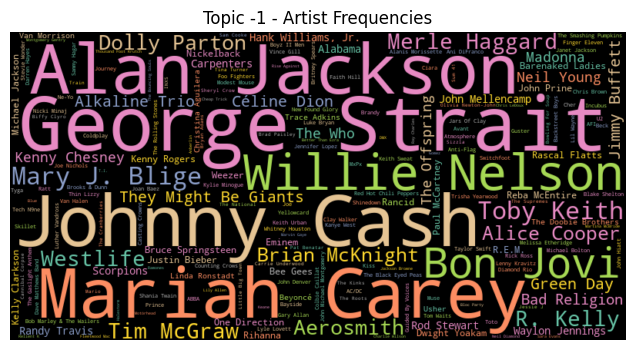

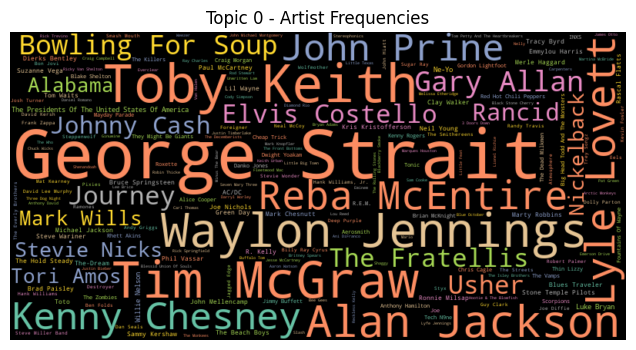

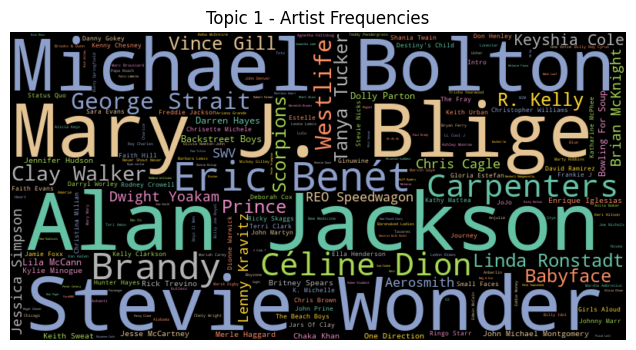

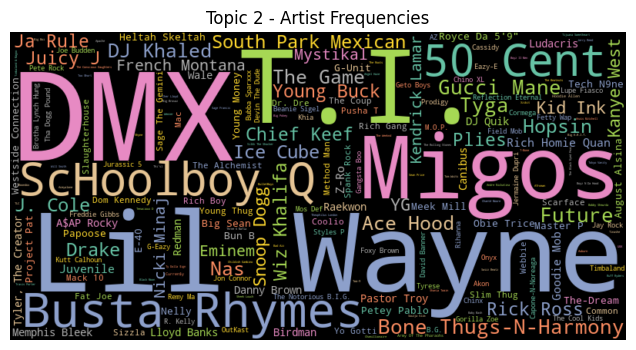

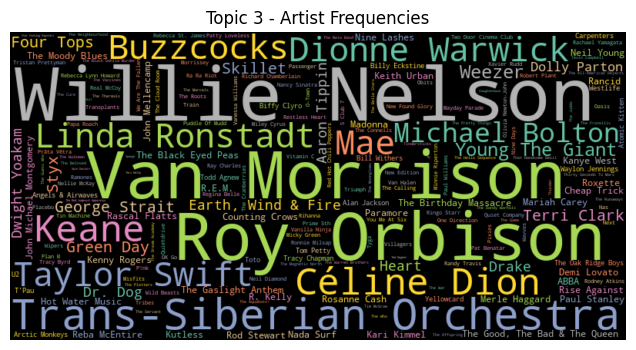

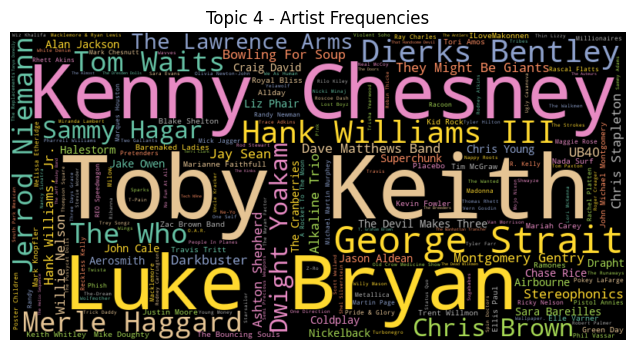

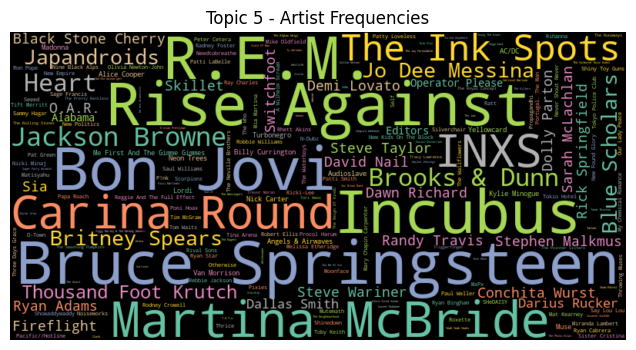

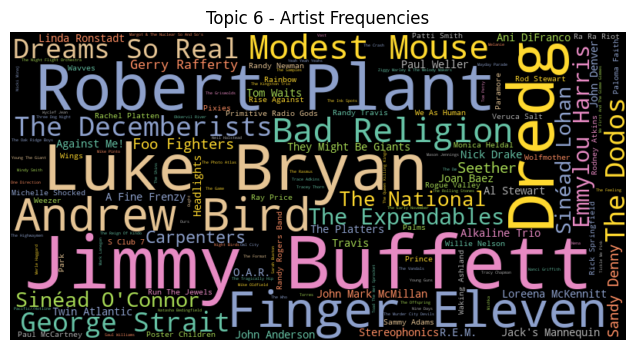

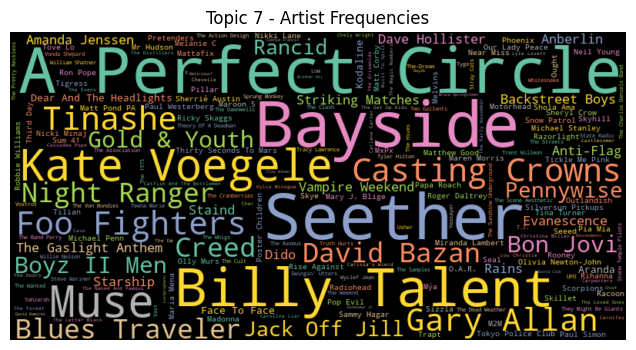

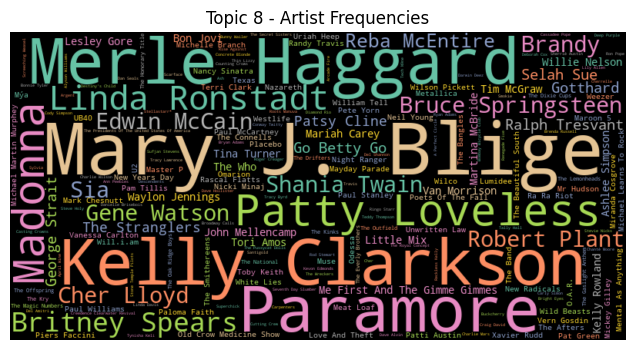

In [55]:
for topic_id in top_10_topics:
    # plot_topic_words_wordcloud(topic_model, topic_id)
    plot_artist_wordcloud(df, topic_id)


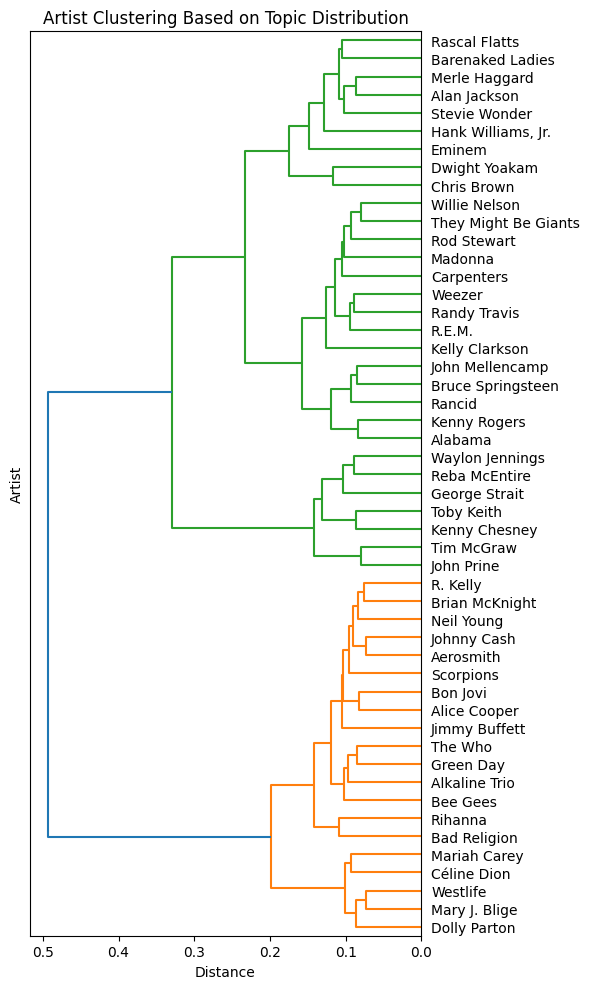

In [ ]:
import pandas as pd
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

# Number of top artists to include
top_n = 50

# 1. Filter to top N artists
top_artists = df_wordcloud["artist"].value_counts().head(top_n).index
df_filtered = df_wordcloud[df_wordcloud["artist"].isin(top_artists)]

# 2. Build artist-topic matrix
artist_topic_matrix = pd.crosstab(df_filtered["artist"], df_filtered["topic"])

# 3. Normalize rows (optional but recommended)
artist_topic_norm = artist_topic_matrix.div(artist_topic_matrix.sum(axis=1), axis=0)

# 4. Perform hierarchical clustering
Z = linkage(artist_topic_norm, method='ward')

# 5. Plot vertical dendrogram
plt.figure(figsize=(6, 10))  # Taller figure for vertical dendrogram
dendrogram(Z,
           labels=artist_topic_norm.index,
           orientation='left',           # Makes it vertical (labels on Y-axis)
           leaf_font_size=10)

plt.title("Artist Clustering Based on Topic Distribution")
plt.xlabel("Distance")
plt.ylabel("Artist")
plt.tight_layout()
plt.show()

In [61]:
import pandas as pd

# Limit to top N artists for readability
top_n = 30
top_artists = df_wordcloud["artist"].value_counts().head(top_n).index
df_filtered = df_wordcloud[df_wordcloud["artist"].isin(top_artists)]

# Create artist-topic frequency matrix
artist_topic_matrix = pd.crosstab(df_filtered["artist"], df_filtered["topic"])

# Normalize by row (topic distribution per artist)
artist_topic_norm = artist_topic_matrix.div(artist_topic_matrix.sum(axis=1), axis=0)


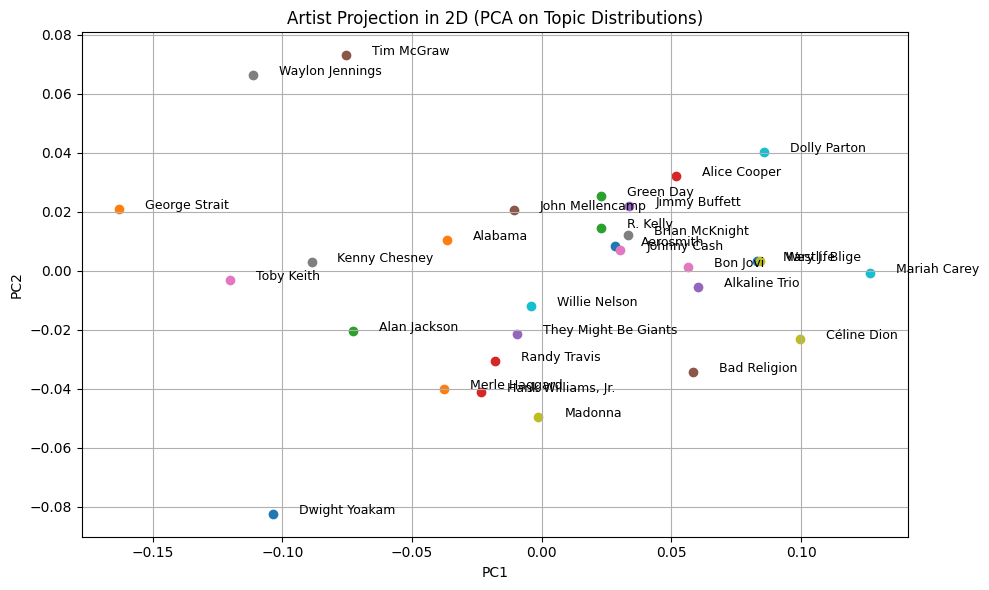

In [62]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=2)
artist_pca = pca.fit_transform(artist_topic_norm)

plt.figure(figsize=(10, 6))
for i, artist in enumerate(artist_topic_norm.index):
    x, y = artist_pca[i]
    plt.scatter(x, y, marker='o')
    plt.text(x + 0.01, y, artist, fontsize=9)

plt.title("Artist Projection in 2D (PCA on Topic Distributions)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.grid(True)
plt.tight_layout()
plt.show()


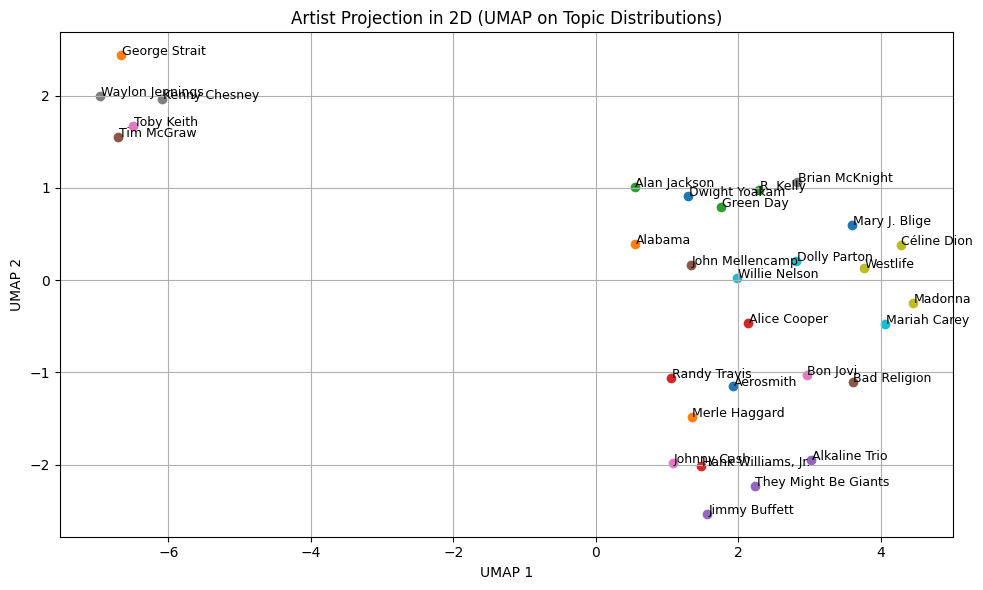

In [63]:
import umap.umap_ as umap

reducer = umap.UMAP(n_neighbors=5, min_dist=0.3, metric='cosine', random_state=42)
artist_umap = reducer.fit_transform(artist_topic_norm)

plt.figure(figsize=(10, 6))
for i, artist in enumerate(artist_topic_norm.index):
    x, y = artist_umap[i]
    plt.scatter(x, y)
    plt.text(x + 0.01, y, artist, fontsize=9)

plt.title("Artist Projection in 2D (UMAP on Topic Distributions)")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.grid(True)
plt.tight_layout()
plt.show()
